In [1]:
# import important libraries
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
# load the transaction dataset
df_retail = pd.read_csv('data/retail_transactions.csv')
df_retail.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,546729,22775,PURPLE DRAWERKNOB ACRYLIC EDWARDIAN,12,2020-03-16 11:36:00,1.25,18231,United Kingdom
1,559898,21868,POTTING SHED TEA MUG,6,2020-07-13 12:18:00,1.25,16225,United Kingdom
2,548648,71459,HANGING JAM JAR T-LIGHT HOLDER,24,2020-04-01 13:20:00,0.85,12949,United Kingdom
3,540543,22173,METAL 4 HOOK HANGER FRENCH CHATEAU,4,2020-01-09 15:23:00,2.95,14395,United Kingdom
4,561390,20726,LUNCH BAG WOODLAND,10,2020-07-27 09:52:00,1.65,17068,United Kingdom


In [3]:
print('The dimention of the dataset\n')
print(df_retail.shape)

print('\nDetail description of the dataset\n')
print(df_retail.info())

The dimention of the dataset

(397884, 8)

Detail description of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397884 entries, 0 to 397883
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    397884 non-null  int64  
 1   StockCode    397884 non-null  object 
 2   Description  397884 non-null  object 
 3   Quantity     397884 non-null  int64  
 4   InvoiceDate  397884 non-null  object 
 5   UnitPrice    397884 non-null  float64
 6   CustomerID   397884 non-null  int64  
 7   Country      397884 non-null  object 
dtypes: float64(1), int64(3), object(4)
memory usage: 24.3+ MB
None


In [4]:
df_retail.describe()

,InvoiceNo,Quantity,UnitPrice,CustomerID
count,397884.000000,397884.000000,397884.000000,397884.000000
mean,560616.934451,12.988238,3.116488,15294.423453
std,13106.117773,179.331775,22.097877,1713.141560
min,536365.000000,1.000000,0.001000,12346.000000
25%,549234.000000,2.000000,1.250000,13969.000000
50%,561893.000000,6.000000,1.950000,15159.000000
75%,572090.000000,12.000000,3.750000,16795.000000
max,581587.000000,80995.000000,8142.750000,18287.000000


In [5]:
df_retail[df_retail['StockCode'].str.contains('23166')]['Quantity'].describe()

count      198.000000
mean       393.515152
std       5272.997869
min          1.000000
25%          4.000000
50%         12.000000
75%         12.000000
max      74215.000000
Name: Quantity, dtype: float64

In [6]:
import plotly.express as px

filtered_data = df_retail[(df_retail['UnitPrice'] < 1000) & (df_retail['Quantity'] < 20)]
fig = px.scatter(filtered_data, x='Quantity', y='UnitPrice', title='Unit Price Analysis')
fig.update_layout(width=800, height=600, showlegend=False)

fig.show()

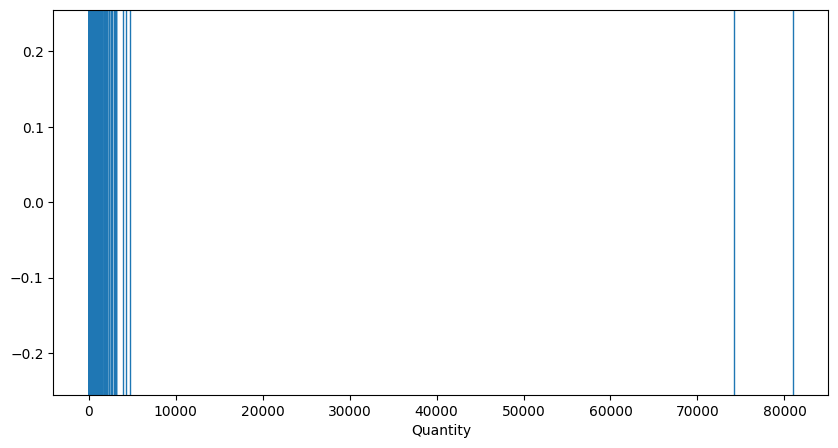

In [7]:
import seaborn as sns

# plot quantity spread
plt.figure(figsize=(10, 5))
sns.rugplot(x=df_retail['Quantity'], height=1)
plt.xlabel('Quantity')
plt.show()

In [8]:
# Quantity outlier inspection
quantity_outlier = df_retail[df_retail['Quantity'] > 70000]
quantity_outlier.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
269320,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2020-12-09 09:15:00,2.08,16446,United Kingdom
389047,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2020-01-18 10:01:00,1.04,12346,United Kingdom


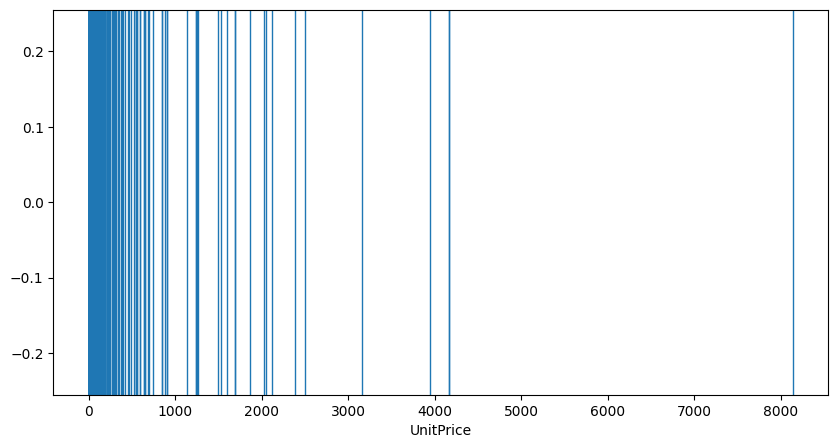

In [9]:
# plot unit price spread
plt.figure(figsize=(10, 5))
sns.rugplot(x=df_retail['UnitPrice'], height=1)
plt.xlabel('UnitPrice')
plt.show()

In [10]:
# unique number of invoices per country
df_retail.drop_duplicates(subset=['InvoiceNo'])['Country'].value_counts().head(10)

Country
United Kingdom    16646
Germany             457
France              389
EIRE                260
Belgium              98
Netherlands          94
Spain                90
Australia            57
Portugal             57
Switzerland          51
Name: count, dtype: int64

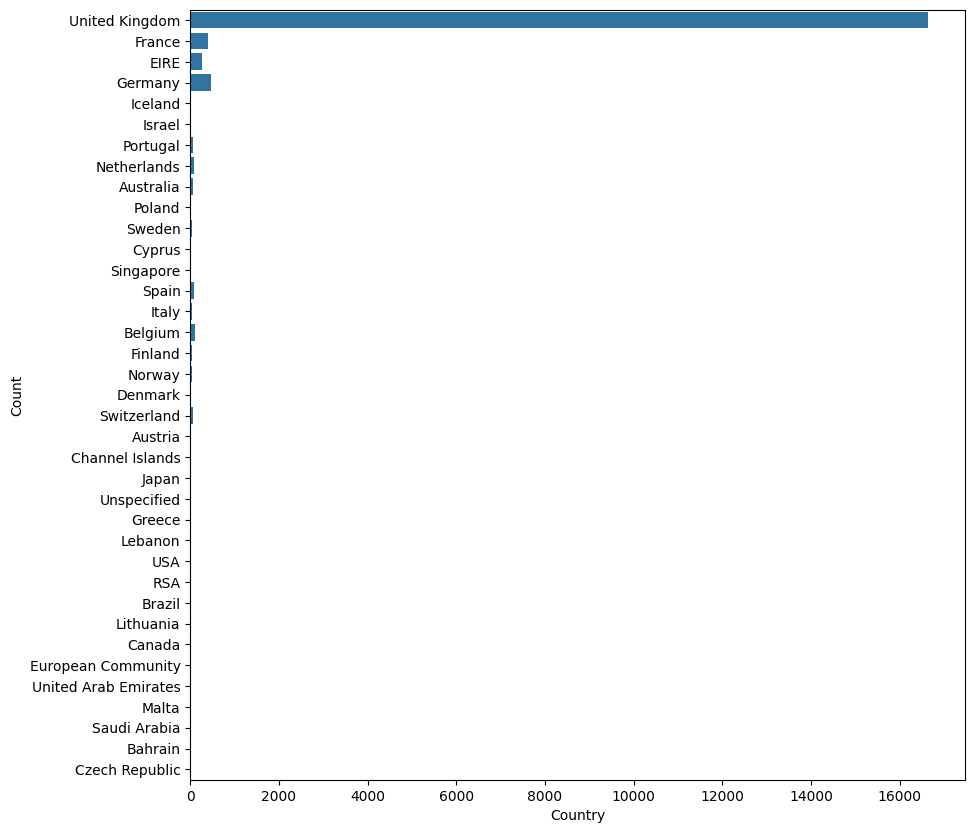

In [11]:
plt.figure(figsize=(10, 10))
sns.countplot(y=df_retail.drop_duplicates(subset=['InvoiceNo'])['Country'])
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

In [12]:
df_retail['Country'].value_counts().head(10)

Country
United Kingdom    354321
Germany             9040
France              8341
EIRE                7236
Spain               2484
Netherlands         2359
Belgium             2031
Switzerland         1841
Portugal            1462
Australia           1182
Name: count, dtype: int64